# Lesson 3: Basic Python for Data Analytics (Stocks Prediction)

# Introduction of Pandas


pandas is a DataFrame Framework, a library that stores data in a highly efficient spreadsheet format and functions.
Efficient in:
1. Data Structure (numpy)
2. Computing time (since DataFrame is processed by C++, it runs in a well streamlined computing environment)
3. Highly optimized and updated processes


[For more details of numpy](https://en.wikipedia.org/wiki/NumPy)

[For more details of pandas cookbook and 10 minutes basic](http://pandas.pydata.org/pandas-docs/stable/10min.html)

## Objective

* To use pandas to load the latest updated data from Yahoo Finance
* To explore and understand the dataset 
    * Viewing the data
    * Correlation Analysis
    * Graphing using matplotlib
* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)
* Comparing models and discuss improvements
* Challenges:
    * Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
    * Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
    * Cleaning out the data
    * Importing data files
* Next lesson:
    * Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

## Loading YahooFinance Dataset

In this demonstration, we will use pandas web data reader. This is an extension of pandas library to communicate with most updated financial data. 

This will include sources as:
* Yahoo! Finance
* Google Finance
* Enigma
* FRED
* Fama/French
* World Bank
* OECD
* Eurostat
* EDGAR Index
* TSP Fund Data
* Oanda currency historical rate
* Nasdaq Trader Symbol Definitions

[For more details of pandas webreader](https://pandas-datareader.readthedocs.io/en/latest/)  

In [186]:
import sys
print (sys.prefix)

/usr


In [187]:
!pip install pandas
!pip show pandas_datareader
!pip install --upgrade pandas_datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Name: pandas-datareader
Version: 0.10.0
Summary: Data readers extracted from the pandas codebase,should be compatible with recent pandas versions
Home-page: https://github.com/pydata/pandas-datareader
Author: The PyData Development Team
Author-email: pydata@googlegroups.com
License: BSD License
Location: /usr/local/lib/python3.7/dist-packages
Requires: pandas, requests, lxml
Required-by: 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [188]:
pip install pandas-datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [189]:
!pip install yfinance
import yfinance as yf


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [190]:
ipsa = ['HLAG.DE','MAERSK-B.CO','VALE','INVERCAP.SN','SQM-B.SN','CHILE.SN','BSANTANDER.SN','COPEC.SN','CENCOSUD.SN','FALABELLA.SN','ENELAM.SN','CMPC.SN','BCI.SN','VAPORES.SN','CAP.SN','CCU.SN','ENELCHILE.SN','ANDINA-B.SN','CONCHATORO.SN','PARAUCO.SN','ITAUCORP.SN','AGUAS-A.SN','COLBUN.SN','CENCOSHOPP.SN','ENTEL.SN','MALLPLAZA.SN','IAM.SN','SMU.SN','ECL.SN','SONDA.SN','RIPLEY.SN','SECURITY.SN', 'QUINENCO.SN', 'BESALCO.SN','MASISA.SN', 'LTM.SN','ENJOY.SN']
ipsa2 = ['NVDA','AMD','TSLA', 'LMT','AMZN', 'FB']
accion_predecir = 'QUINENCO.SN'


In [191]:
import pandas as pd
import datetime
import pandas_datareader.data as web
from pandas import Series, DataFrame

#start = datetime.datetime(2002, 1, 1)
start = datetime.datetime(2000, 1, 1)
end = datetime.datetime(2022, 11, 17)

df = web.DataReader(accion_predecir, 'yahoo', start, end)
df.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2022-11-11,2718.000000,2650.100098,2700.0,2701.399902,7891.0,2701.399902
2022-11-14,2721.100098,2646.100098,2665.0,2668.800049,10898.0,2668.800049
2022-11-15,2695.399902,2650.000000,2680.0,2680.000000,98368.0,2680.000000
2022-11-16,2678.699951,2660.000000,2675.0,2673.699951,12080.0,2673.699951
2022-11-17,2700.000000,2650.000000,2700.0,2670.100098,236915.0,2670.100098


In [192]:
#CODIGO EN DESARROLLO

def acciones(accion_predecirs):
  df = accion_predecirs[0:-3]
  globals()[str(accion_predecirs.replace(".",""))] = web.DataReader(accion_predecirs, 'yahoo', start, end)
  return globals()[str(accion_predecirs).replace(".","")]
 
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  print(d)
  d.tail()
  print(d)

  print(type(d))
  print("dataframe name: "+str(d))
 

******************************************************************************
HLAG.DE
                  High         Low        Open       Close     Volume  \
Date                                                                    
2015-11-06   20.181255   19.785543   19.835009   19.993292  1775788.0   
2015-11-09   20.131790   19.859739   20.131790   19.924044    52918.0   
2015-11-10   20.240612   19.785543   19.933935   19.825115   236784.0   
2015-11-11   20.428574   19.513493   19.884472   19.736080  1004556.0   
2015-11-12   19.958668   19.686617   19.696508   19.785543    56239.0   
...                ...         ...         ...         ...        ...   
2022-11-11  189.000000  179.100006  182.100006  185.800003    61961.0   
2022-11-14  200.399994  184.300003  190.399994  193.100006    56625.0   
2022-11-15  196.600006  182.199997  194.699997  190.899994    30326.0   
2022-11-16  190.199997  185.100006  190.000000  188.000000    26424.0   
2022-11-17  191.899994  185.199997  1

Get the dimension of dataframe

In [193]:
'''
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  d.tail()
  print(d)
  print("******************************************************************************")

'''

'\nfor i in ipsa:\n  print("******************************************************************************")\n  print(i)\n  d = acciones(i)\n  d.tail()\n  print(d)\n  print("******************************************************************************")\n\n'

## Exploring the data 

First we will need to explore the data.
This means understanding the stocks data trend thoroughly by finding key measures
* rolling mean (moving average) -- to determine trend
* return deviation -- to determine return deviation

[For more details of rolling mean](http://www.investopedia.com/articles/active-trading/052014/how-use-moving-average-buy-stocks.asp) 


In [194]:
close_px = VAPORESSN['Adj Close']
mavg = close_px.rolling(window=100).mean()
mavg.tail(10)

Date
2022-11-04    81.523276
2022-11-07    81.062638
2022-11-08    80.635500
2022-11-09    80.379500
2022-11-10    80.200000
2022-11-11    80.072000
2022-11-14    79.937500
2022-11-15    79.840500
2022-11-16    79.740700
2022-11-17    79.609700
Name: Adj Close, dtype: float64

In [195]:

for i in ipsa:

  globals()["close_px_" + str(i).replace(".","")] = globals()[str(i).replace(".","")]['Adj Close']
  globals()["mavg" + str(i).replace(".","")] = close_px.rolling(window=100).mean()
  globals()["mavg" + str(i).replace(".","")].tail(10)

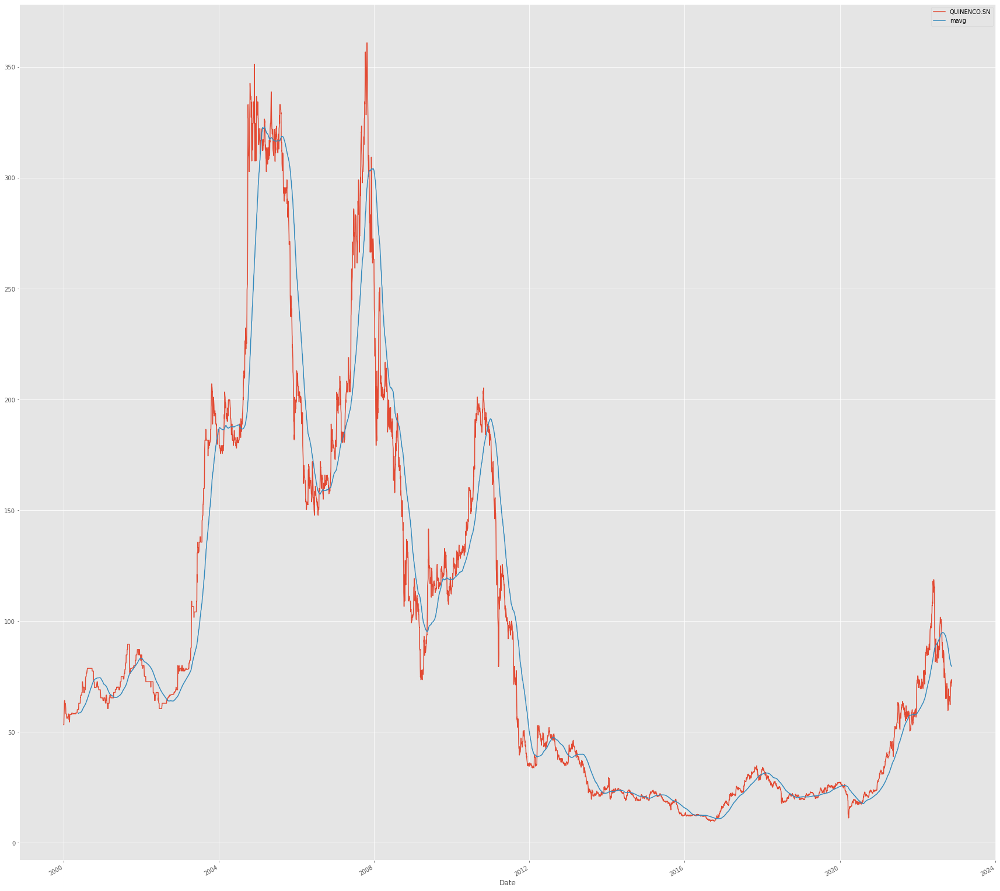

In [196]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import style

# Adjusting the size of matplotlib
import matplotlib as mpl
mpl.rc('figure', figsize=(30, 30))
mpl.__version__

# Adjusting the style of matplotlib
style.use('ggplot')

close_px.plot(label=accion_predecir)
mavg.plot(label='mavg')
plt.legend()

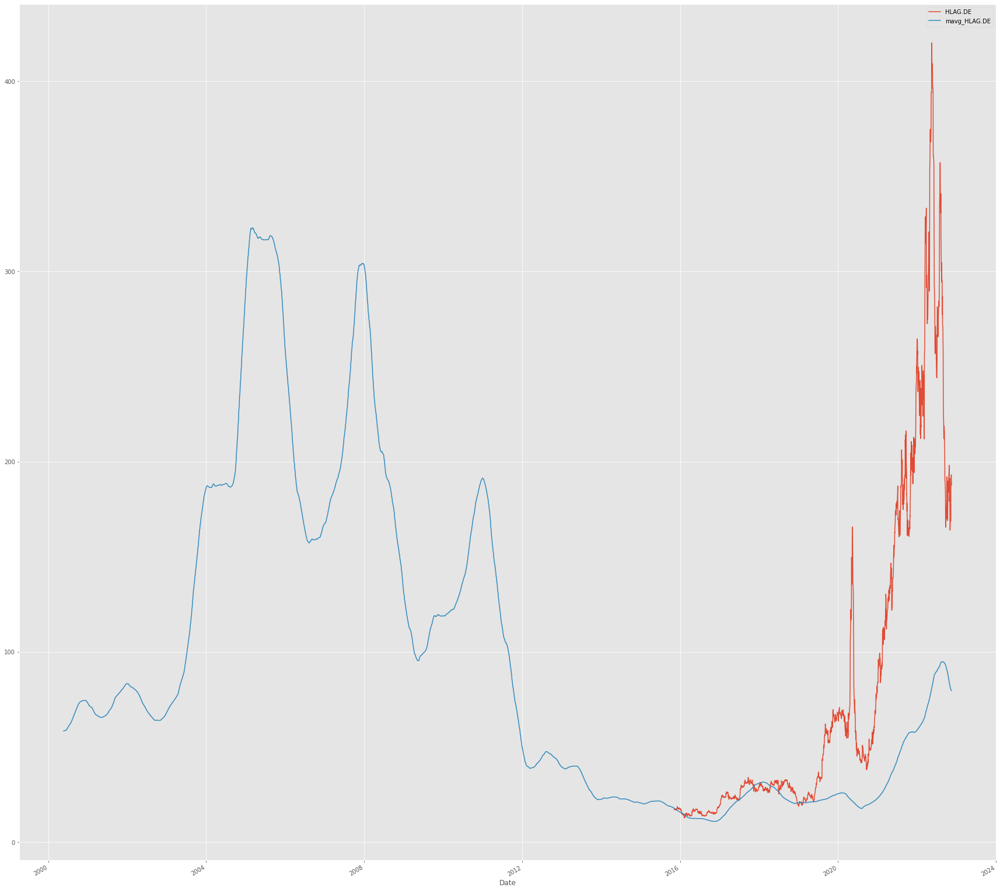

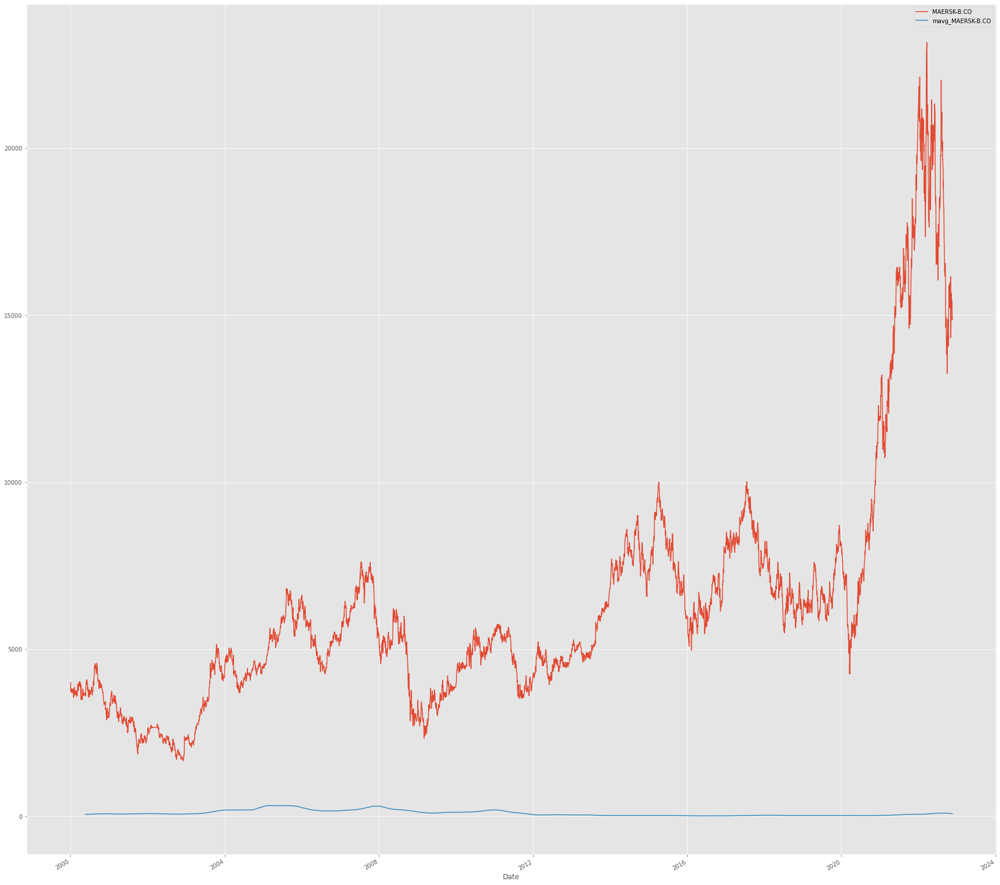

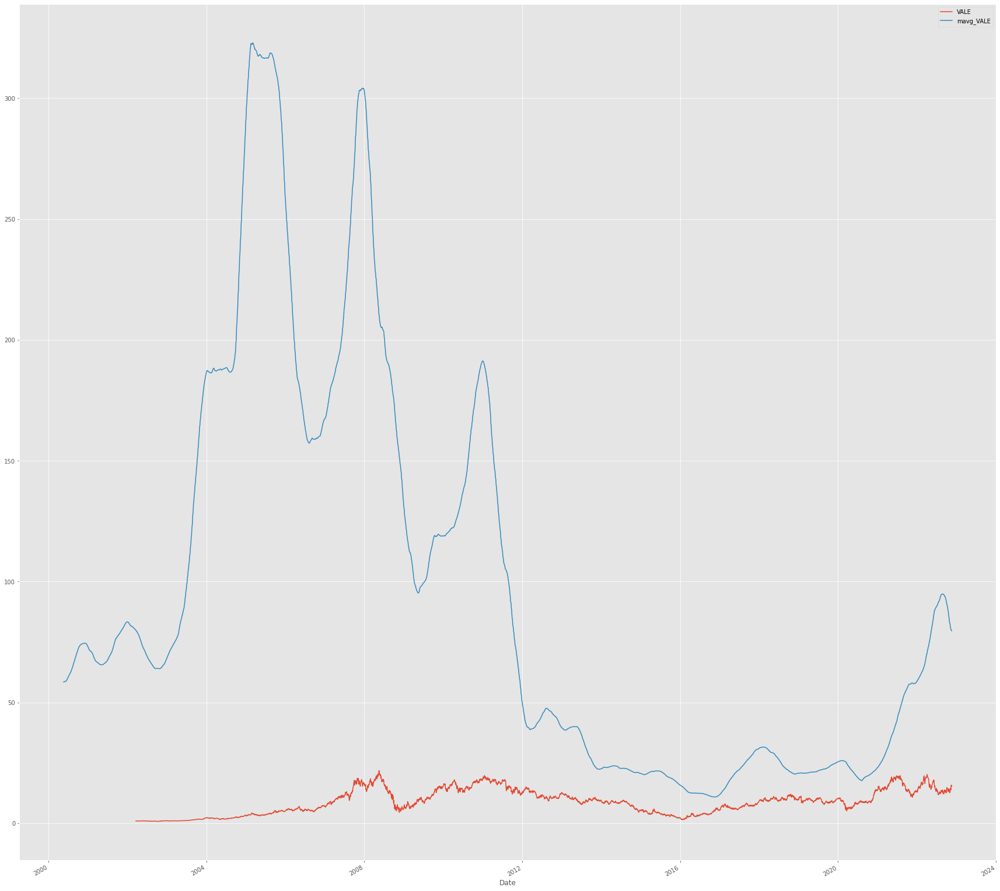

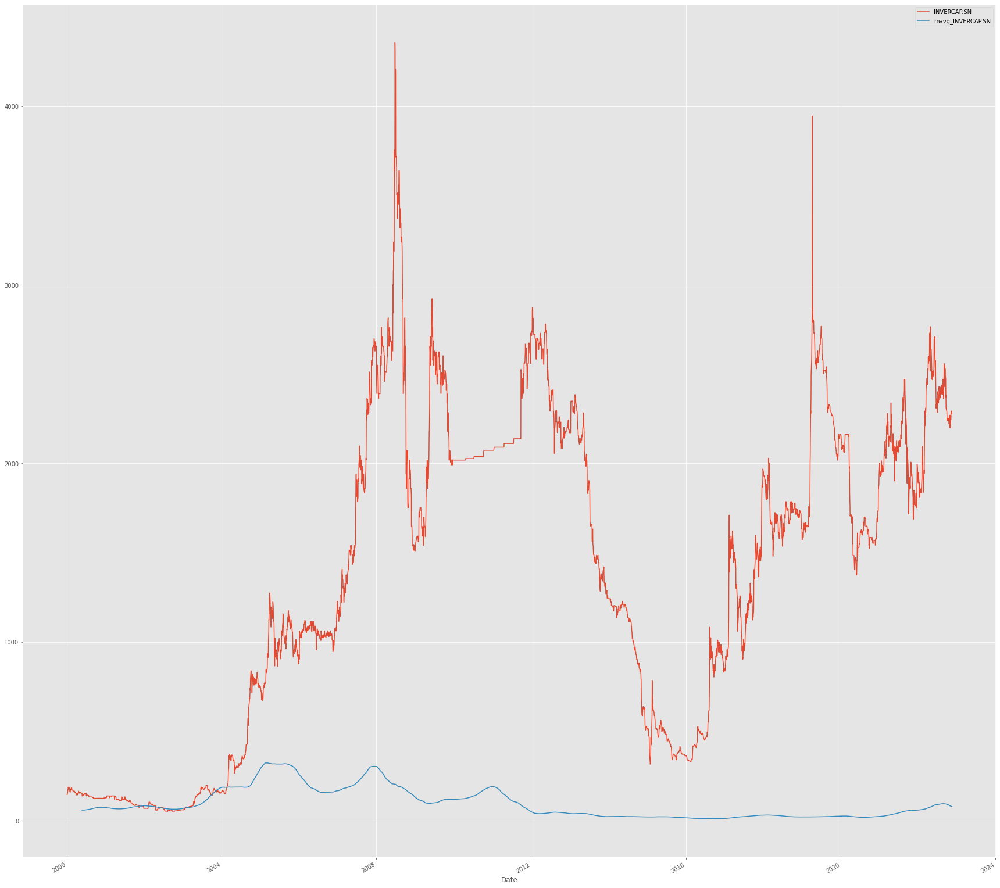

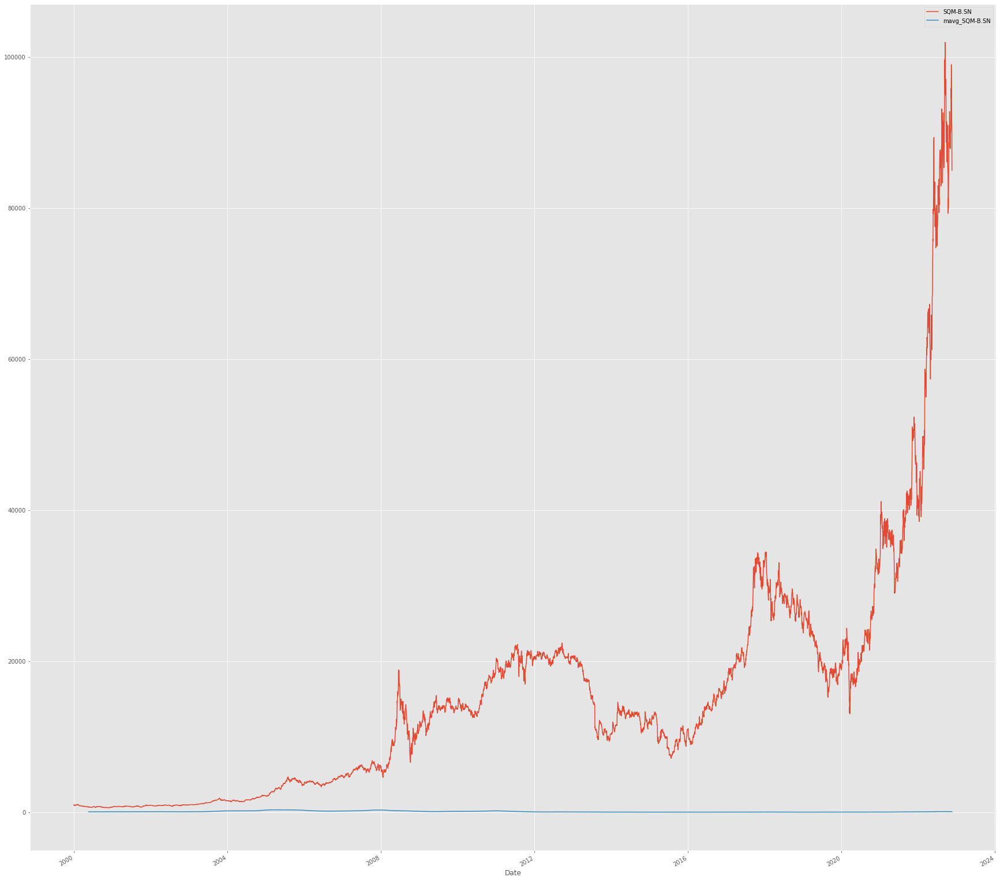

...

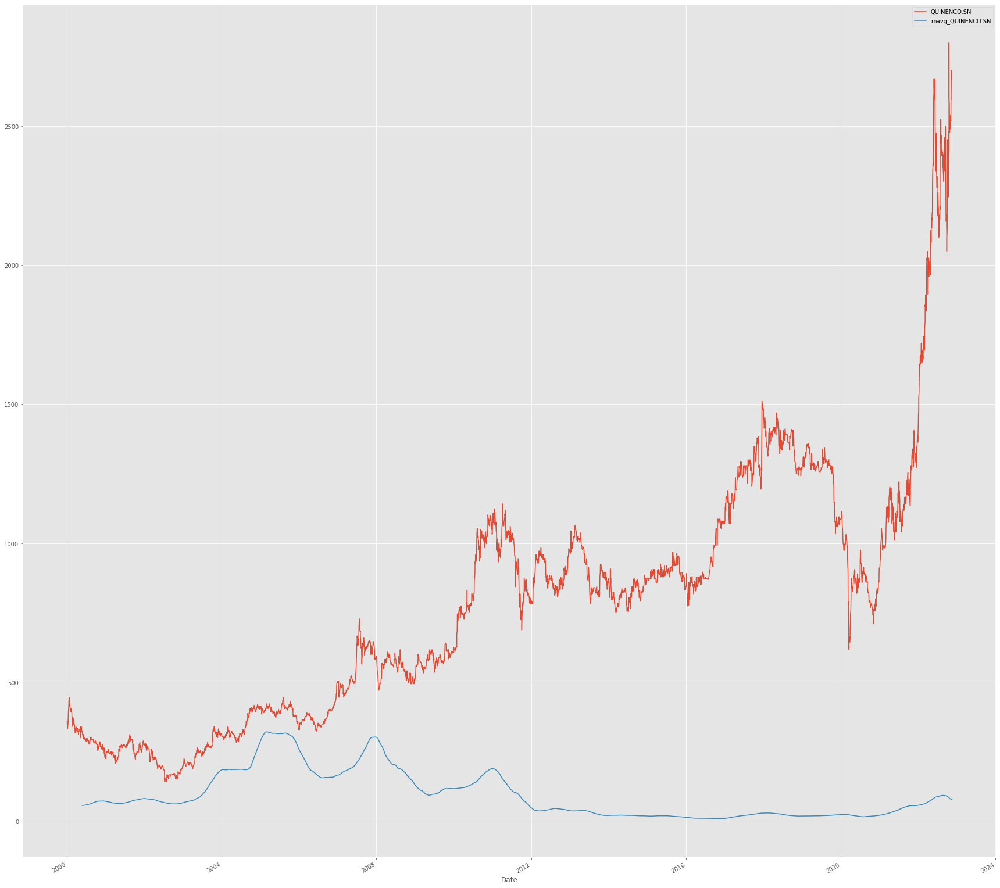

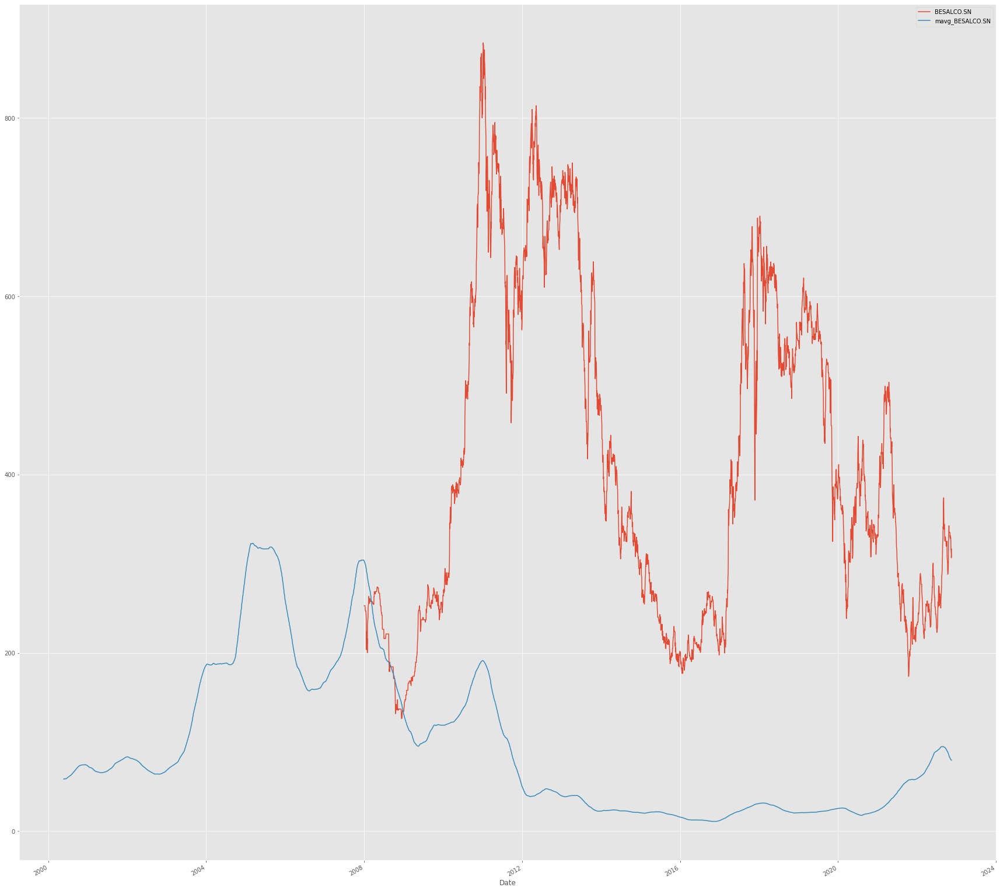

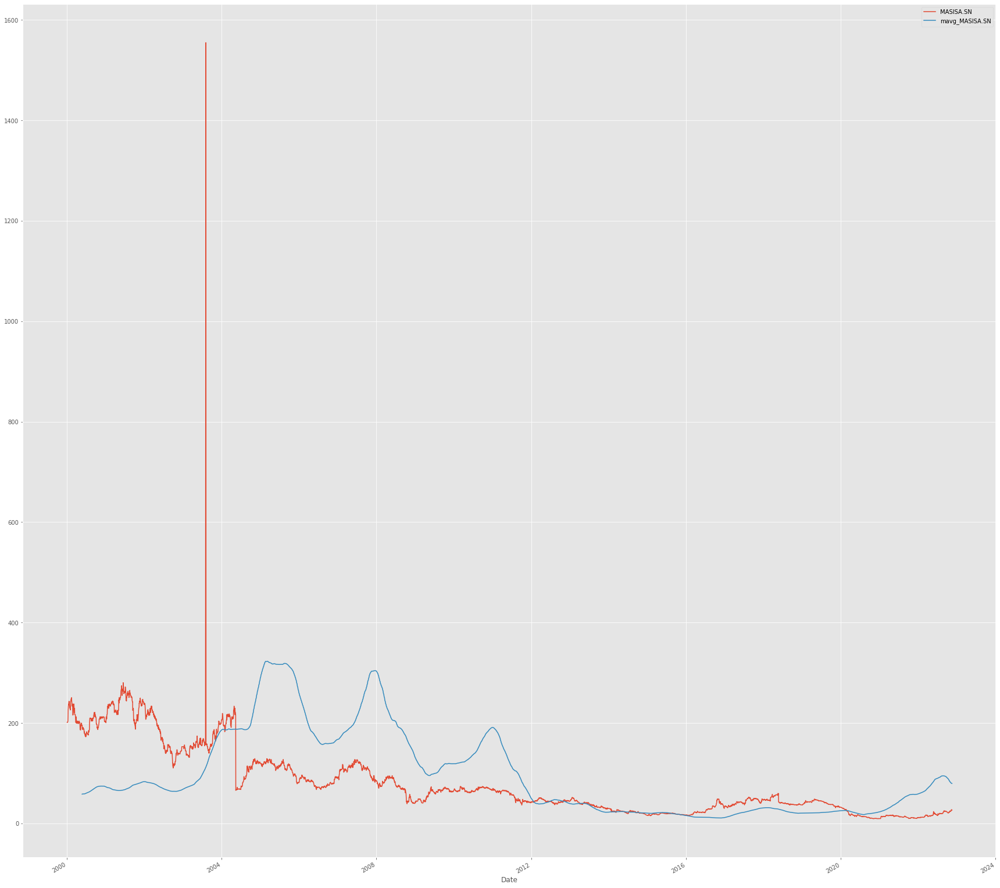

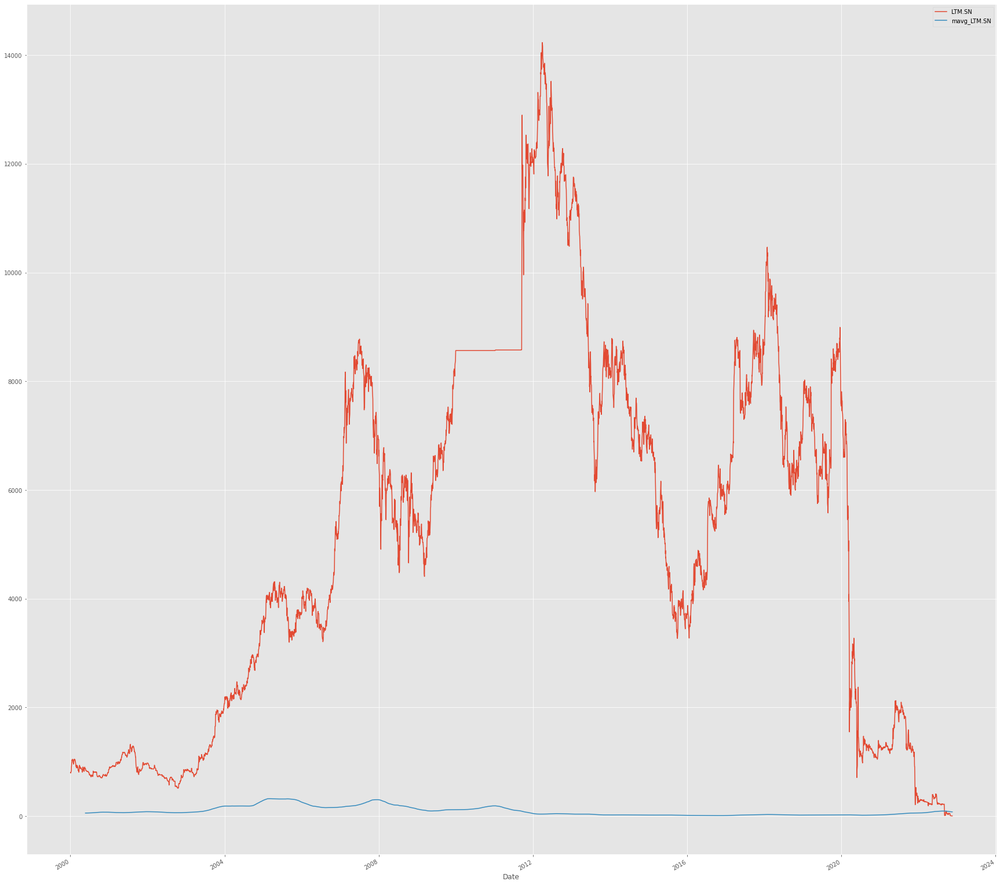

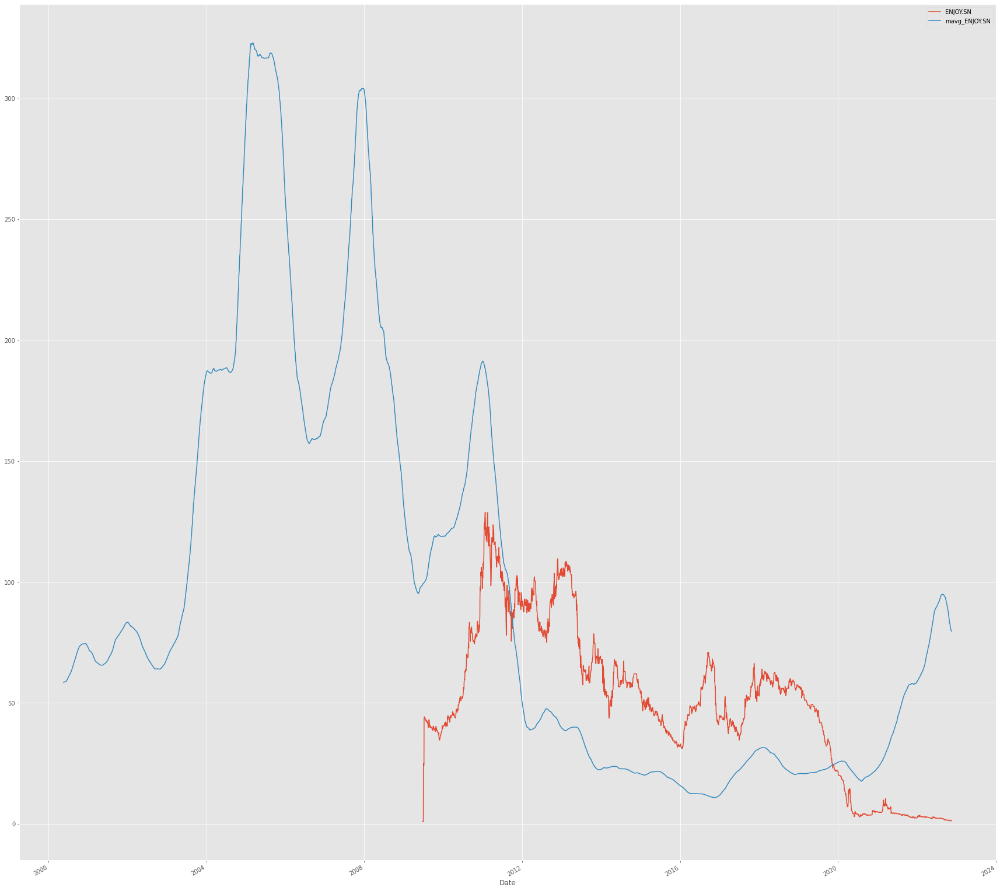

In [197]:
for i in ipsa:
  %matplotlib inline
  import matplotlib.pyplot as plt
  from matplotlib import style

  # Adjusting the size of matplotlib
  import matplotlib as mpl
  mpl.rc('figure', figsize=(30, 30))
  mpl.__version__

  # Adjusting the style of matplotlib
  style.use('ggplot')

  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)
  plt.legend()
  plt.show()


Returns defined as: 
$$ $$
$$r_t = \frac{p_t - p_{t-1}}{p_{t-1}} = \frac{p_t}{p_{t-1}} - 1$$

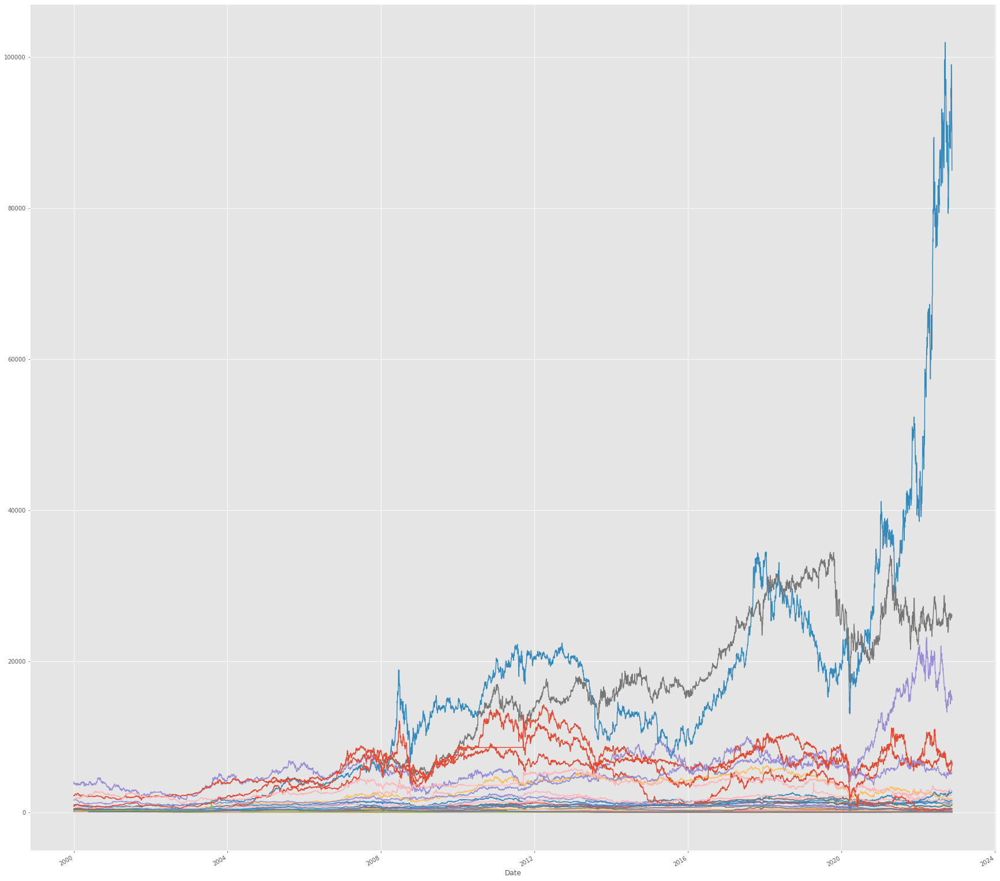

In [198]:
for i in ipsa:
  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)

  globals()["rets"+str(i).replace(".","")] = globals()["close_px_" + str(i).replace(".","")] / globals()["close_px_" + str(i).replace(".","")] - 1
  globals()["rets"+str(i).replace(".","")].head()

  globals()["close_px_" + str(i).replace(".","")].pct_change().head()

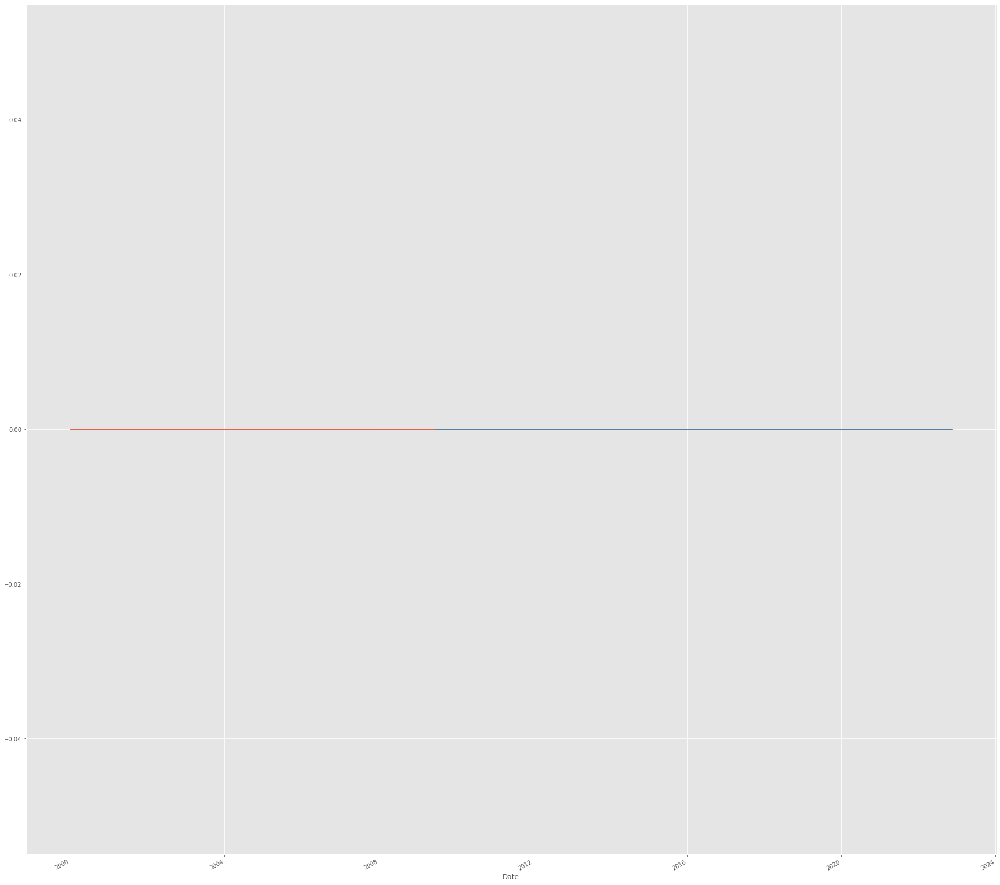

In [199]:
for i in ipsa:
  globals()["rets"+str(i).replace(".","")].plot(label='return')

## Doing the competitor analysis/Correlation

1. How does one company perform in relative with its competitor
2. What are the correlations among these companies

In [200]:

dfcomp = web.DataReader(ipsa,'yahoo',
                               start=start, 
                               end=end)['Adj Close']
dfcomp.tail()

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Date,,,,,,,,,,,,,,,,,,,,,
2022-11-11,185.800003,15450.0,15.45,2288.300049,99000.0,84.500000,33.970001,6585.000000,1300.0,1738.0,...,100.949997,500.000000,328.890015,147.410004,155.000000,2701.399902,317.619995,27.370001,6.000,1.246
2022-11-14,193.100006,15425.0,15.71,2293.100098,95150.0,84.500000,33.849998,6560.000000,1285.0,1685.0,...,100.650002,512.809998,324.339996,144.789993,156.119995,2668.800049,310.890015,27.340000,5.865,1.307
2022-11-15,190.899994,15315.0,15.81,2293.100098,91414.0,83.900002,33.360001,6385.000000,1291.0,1670.0,...,103.669998,500.109985,327.600006,141.839996,154.100006,2680.000000,306.559998,27.340000,5.719,1.369
2022-11-16,188.000000,14855.0,15.22,2293.199951,90900.0,84.389999,33.000000,6360.000000,1300.0,1646.0,...,106.500000,503.450012,325.000000,143.320007,154.789993,2673.699951,313.290009,26.740000,5.881,1.487
2022-11-17,187.699997,14970.0,15.33,2278.300049,85000.0,84.959999,33.000000,6389.899902,1300.0,1605.0,...,108.419998,504.410004,324.690002,146.000000,155.839996,2670.100098,316.559998,26.559999,5.879,1.518


Get the dimension of dataframes

In [201]:
dfcomp.shape

(5933, 37)

In [202]:
retscomp = dfcomp.pct_change()

corr = retscomp.corr()
corr

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Symbols,,,,,,,,,,,,,,,,,,,,,
HLAG.DE,1.000000,0.388565,0.117555,0.036344,0.113413,0.059315,0.080493,0.062754,0.006300,0.083929,...,0.058972,0.043347,0.081244,0.032992,0.082582,0.097641,0.044301,0.052438,0.013835,0.066028
MAERSK-B.CO,0.388565,1.000000,0.309075,0.104848,0.197217,0.168727,0.203435,0.178773,0.157733,0.170470,...,0.137833,0.110512,0.169481,0.183358,0.111406,0.110996,0.144115,0.024744,0.066211,-0.021574
VALE,0.117555,0.309075,1.000000,0.149113,0.358165,0.235067,0.292560,0.272133,0.233986,0.253457,...,0.126546,0.146598,0.210979,0.232461,0.114226,0.129637,0.139572,0.018386,0.088740,-0.009620
INVERCAP.SN,0.036344,0.104848,0.149113,1.000000,0.144574,0.132044,0.126027,0.137055,0.115274,0.134523,...,0.136415,0.101024,0.115745,0.149771,0.115176,0.095914,0.127495,0.020051,0.025509,0.004759
SQM-B.SN,0.113413,0.197217,0.358165,0.144574,1.000000,0.334365,0.358231,0.345500,0.301918,0.326235,...,0.214330,0.163510,0.286747,0.247934,0.172601,0.179792,0.208044,0.037020,0.130325,0.029882
CHILE.SN,0.059315,0.168727,0.235067,0.132044,0.334365,1.000000,0.587172,0.487133,0.458737,0.477362,...,0.421329,0.391420,0.384491,0.377228,0.301011,0.251232,0.292026,0.223949,0.087840,0.007722
BSANTANDER.SN,0.080493,0.203435,0.292560,0.126027,0.358231,0.587172,1.000000,0.446203,0.408605,0.432337,...,0.369094,0.268354,0.366774,0.372674,0.289375,0.238839,0.285717,0.030206,0.130333,0.011715
COPEC.SN,0.062754,0.178773,0.272133,0.137055,0.345500,0.487133,0.446203,1.000000,0.414883,0.475707,...,0.336953,0.237125,0.369469,0.408748,0.245418,0.255579,0.287035,0.049295,0.100496,0.007354
CENCOSUD.SN,0.006300,0.157733,0.233986,0.115274,0.301918,0.458737,0.408605,0.414883,1.000000,0.452176,...,0.379465,0.209003,0.383710,0.434221,0.262958,0.187134,0.290127,0.044813,0.102830,0.004057


In [203]:
#plt.scatter(retscomp.CAP.SN, retscomp.VAPORES.SN)
#plt.xlabel('Returns CAP.SN')
#plt.ylabel('Returns VAPORES.SN')

You can do scatter matrix with all the competitors data and find the kde of each m
KDE will determine if your chart is more normally distributed leaning to the 
* left: Returns are more likely to be negative in the long run
* centre: Returns are more likely to be 0 in the long run
* right: Returns are more likely to be positive in the long run

In [204]:
pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [205]:
#pd.plotting.scatter_matrix(retscomp, diagonal='kde', figsize=(600, 600));

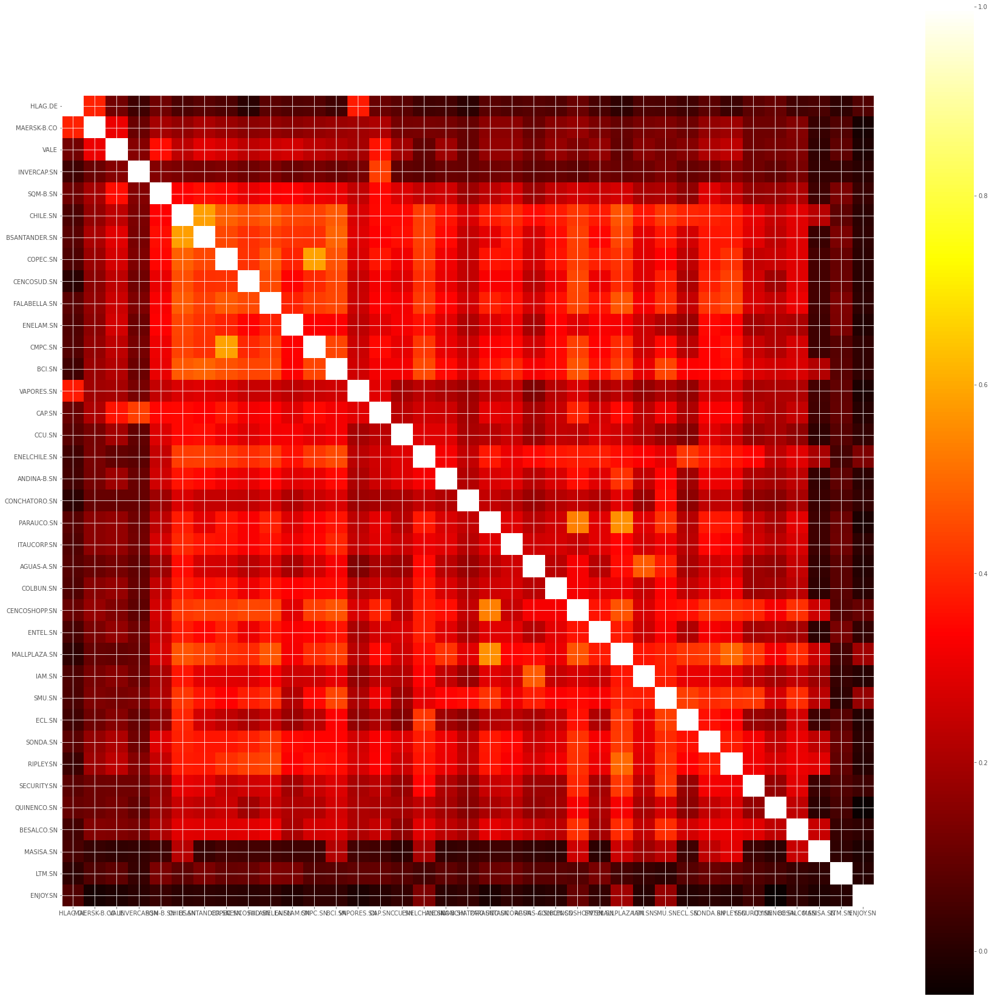

In [206]:
plt.imshow(corr, cmap='hot', interpolation='none')
plt.colorbar()
plt.xticks(range(len(corr)), corr.columns)
plt.yticks(range(len(corr)), corr.columns);

[texto del vínculo](https://)## Stocks mean and Risk calculation
Which stocks are risky and bearing returns

Kurtosis and skewness

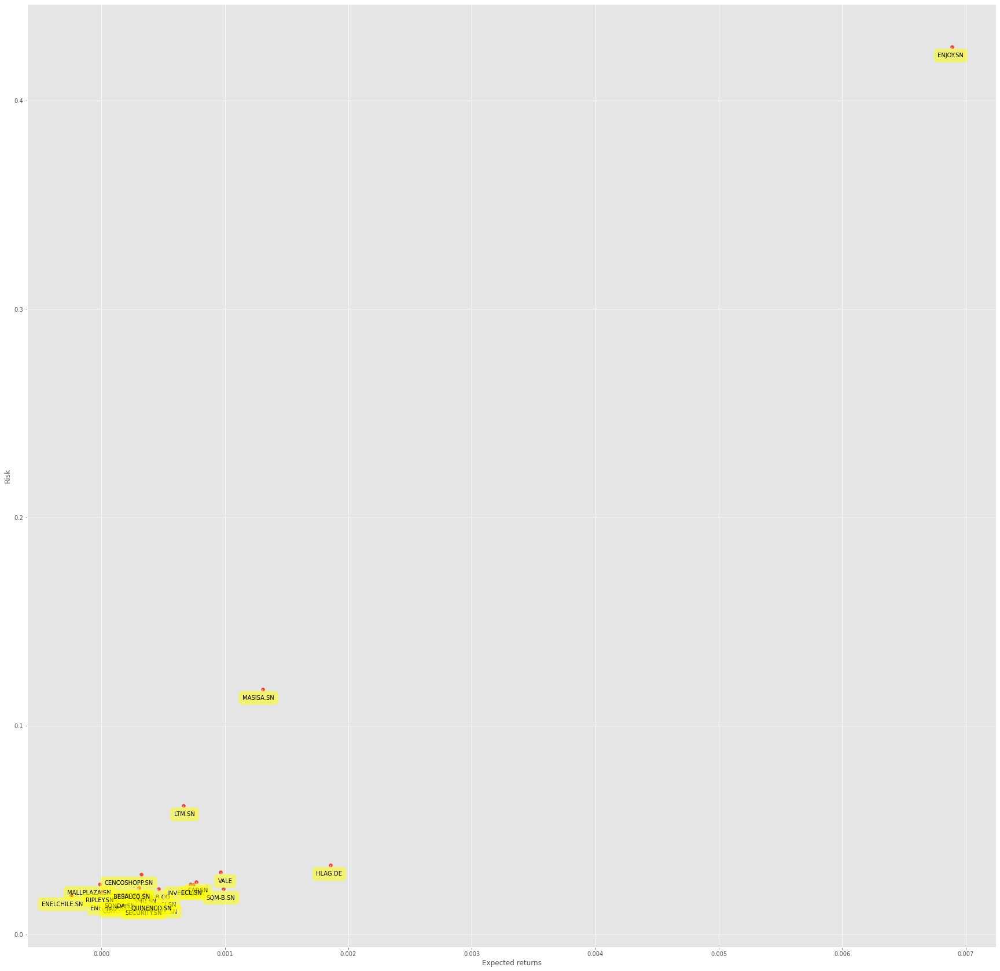

In [207]:
plt.scatter(retscomp.mean(), retscomp.std())
plt.xlabel('Expected returns')
plt.ylabel('Risk')
for label, x, y in zip(retscomp.columns, retscomp.mean(), retscomp.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (20, -20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        bbox = dict(boxstyle = 'round,pad=0.7', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))

# Predicting the stocks price

To predict the return of the stocks in the next period - Prediction analysis
* Simple Linear Analysis
* Quadratic Linear Analysis (QDA)
* K Nearest Neighbor (KNN)

But first, let us extract the necessary columns first from df:
* Adj Close
* Adj Volume
* HL Percentage
* PCT Change

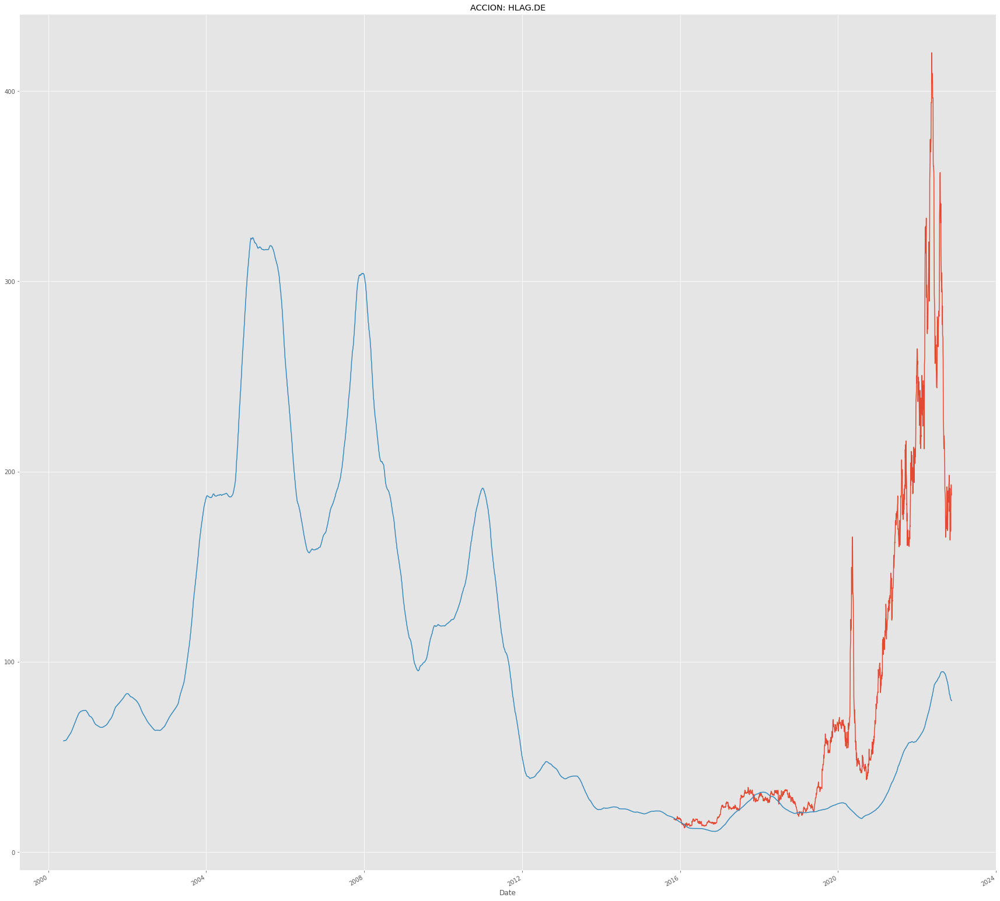

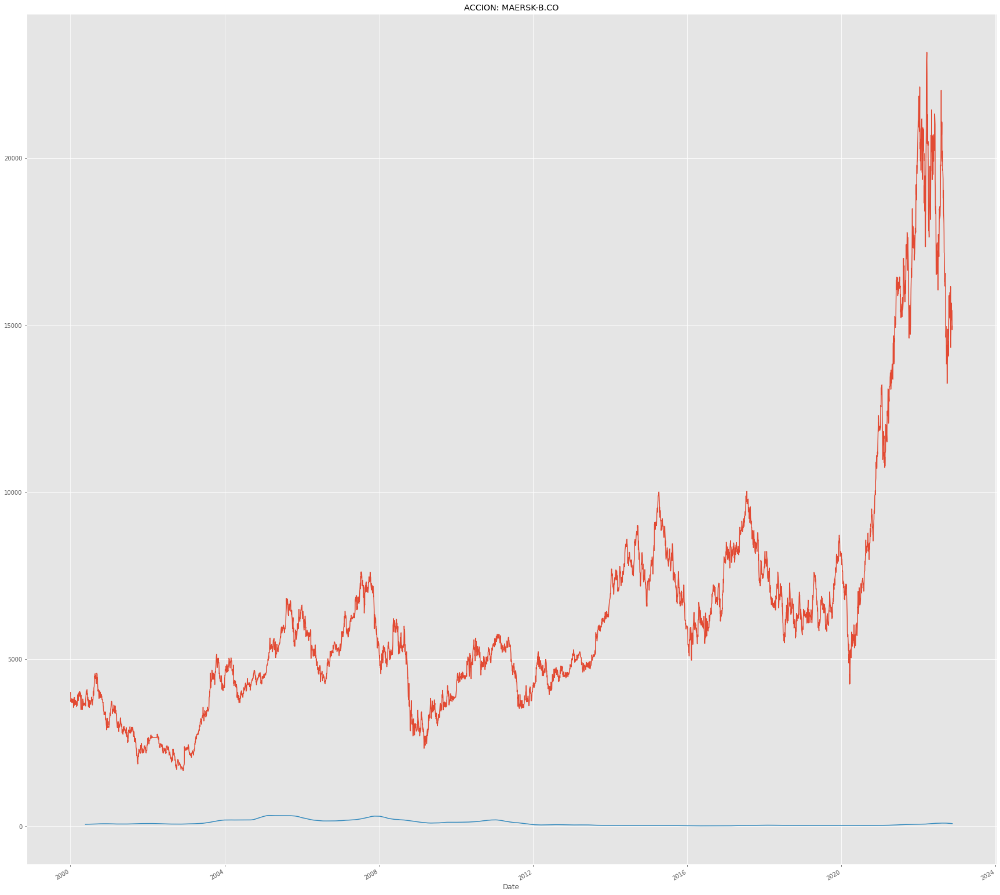

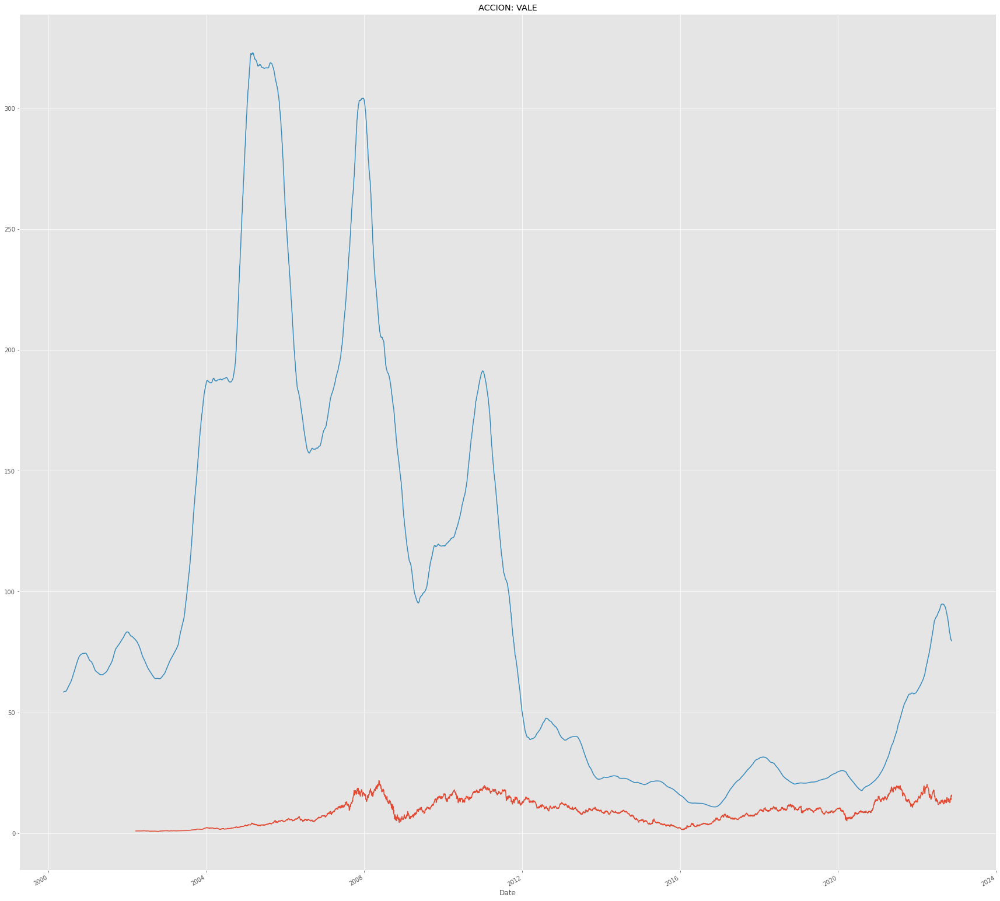

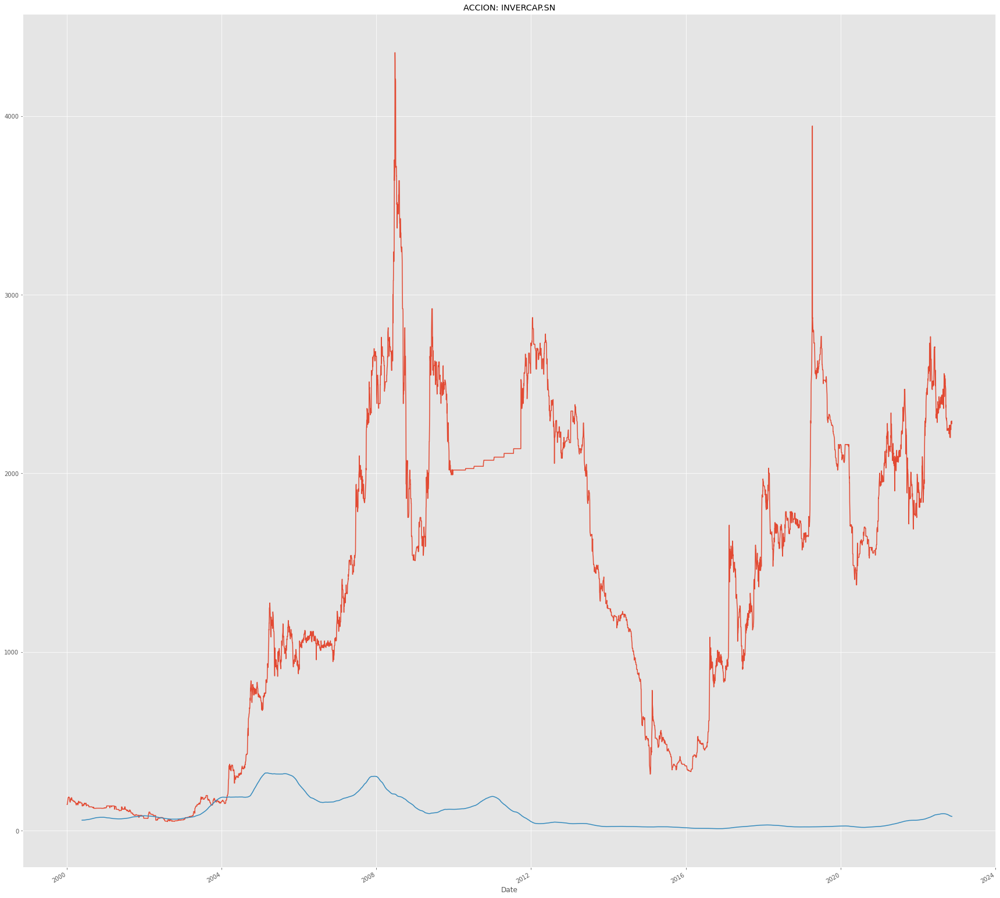

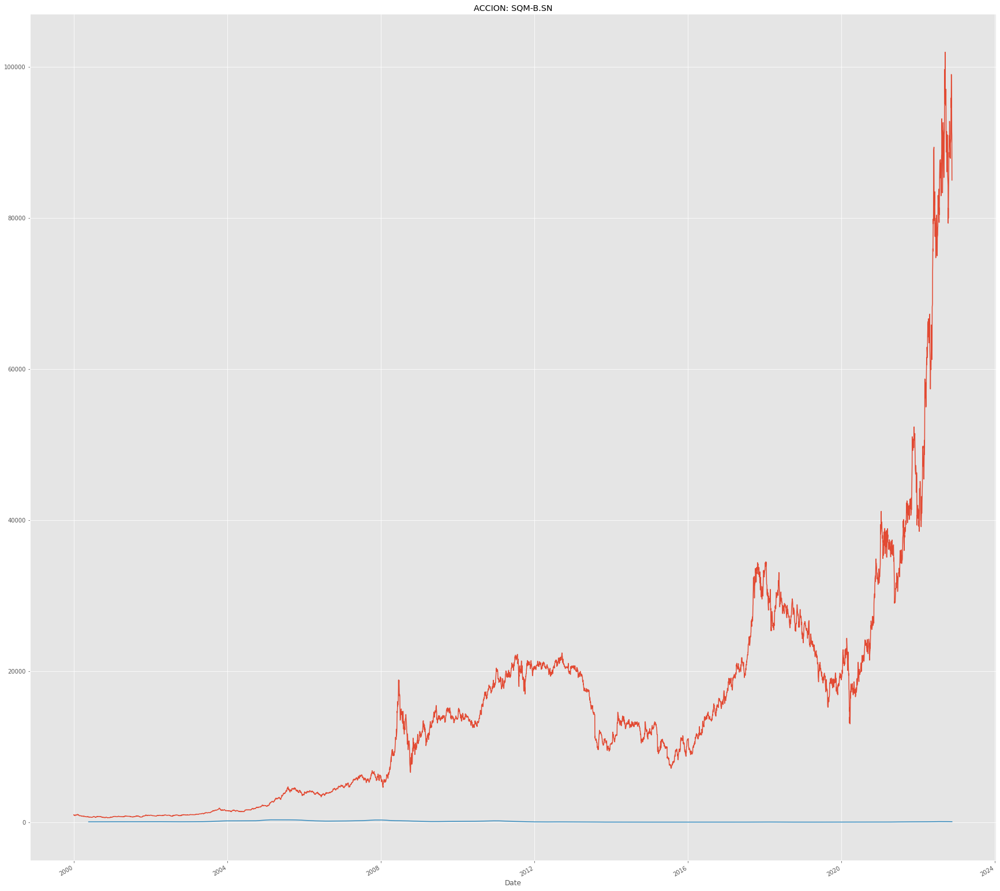

...

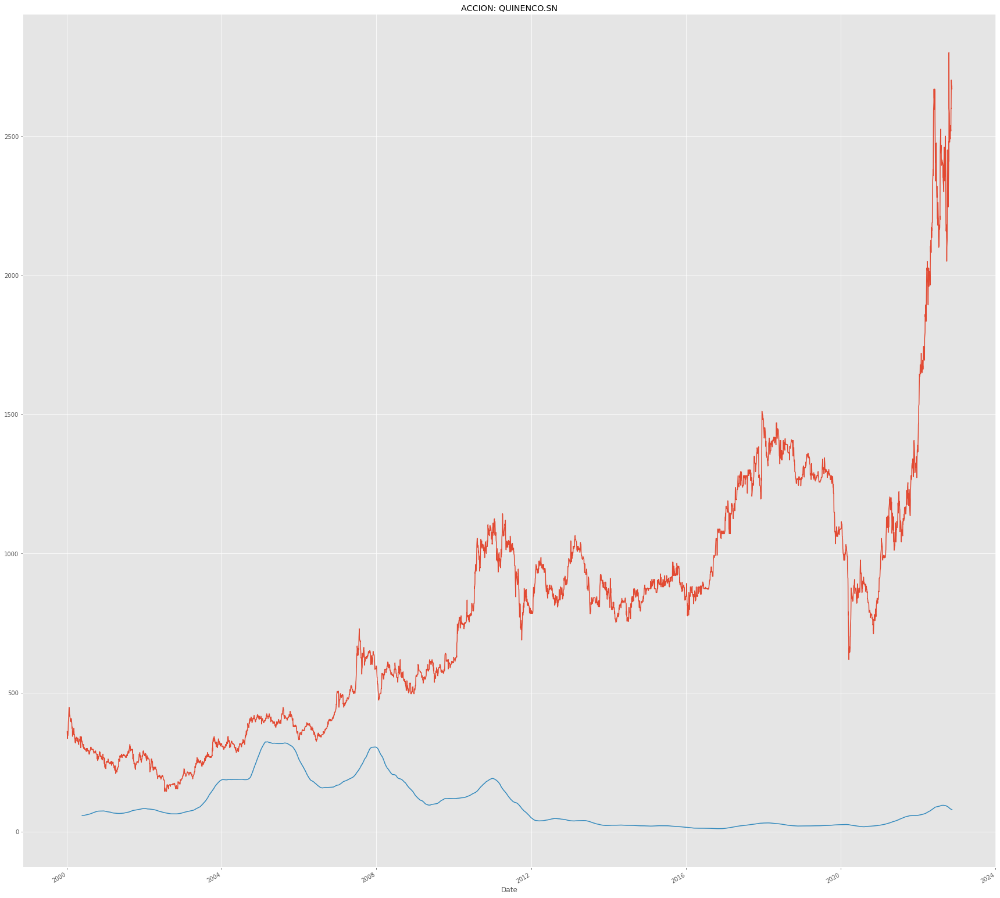

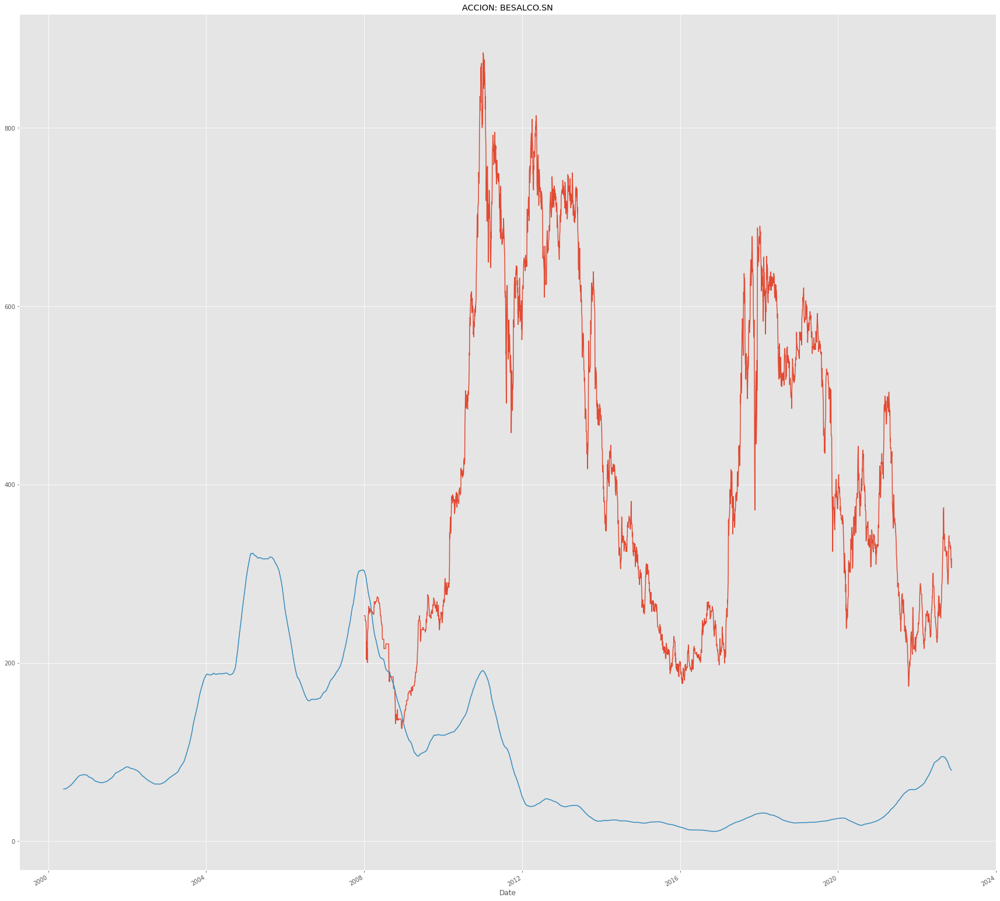

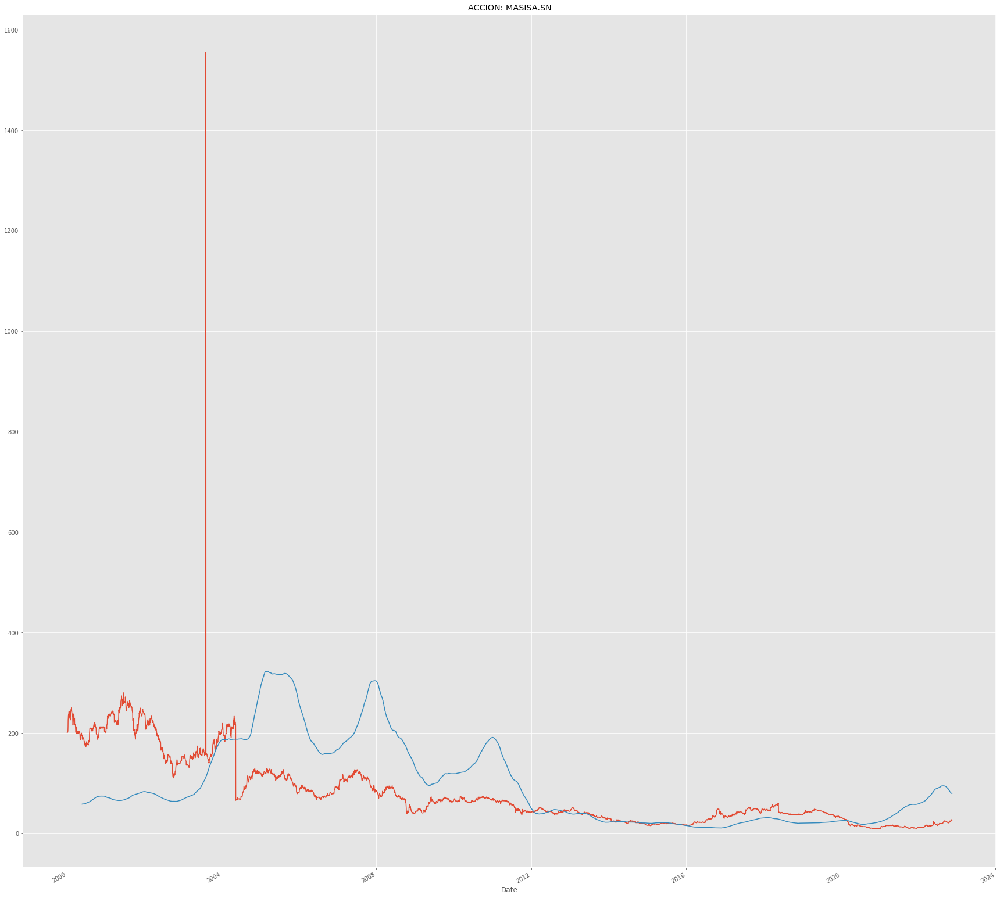

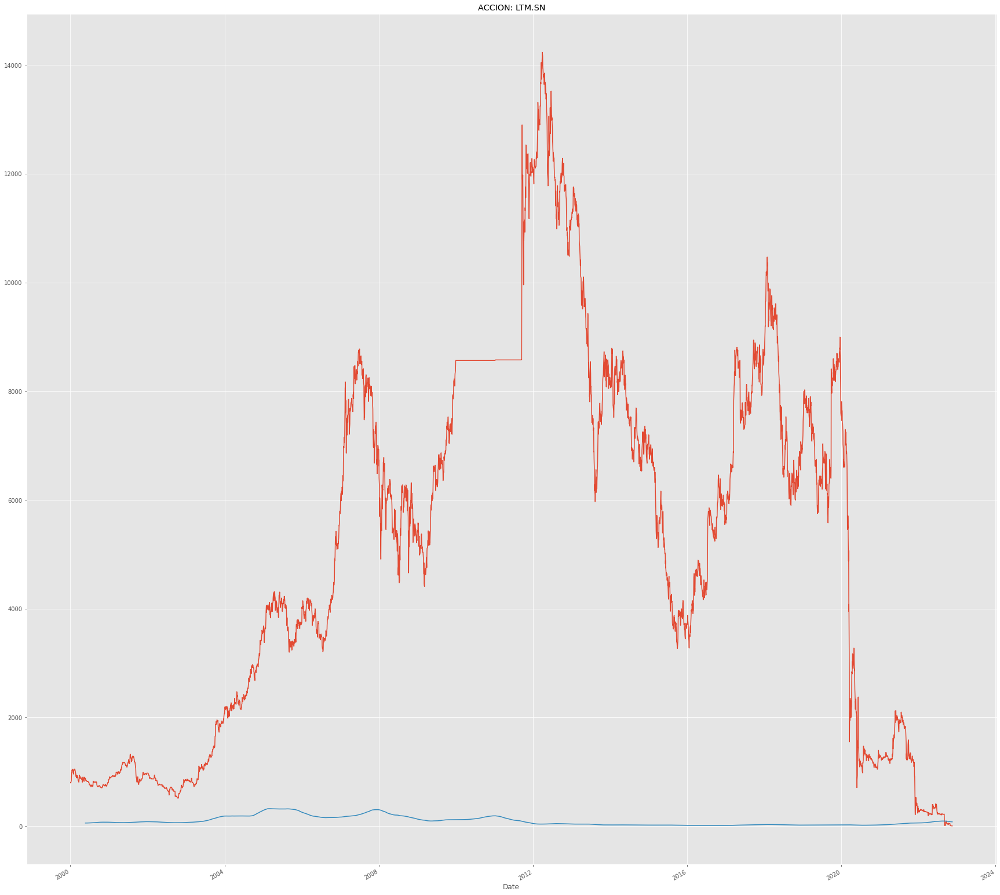

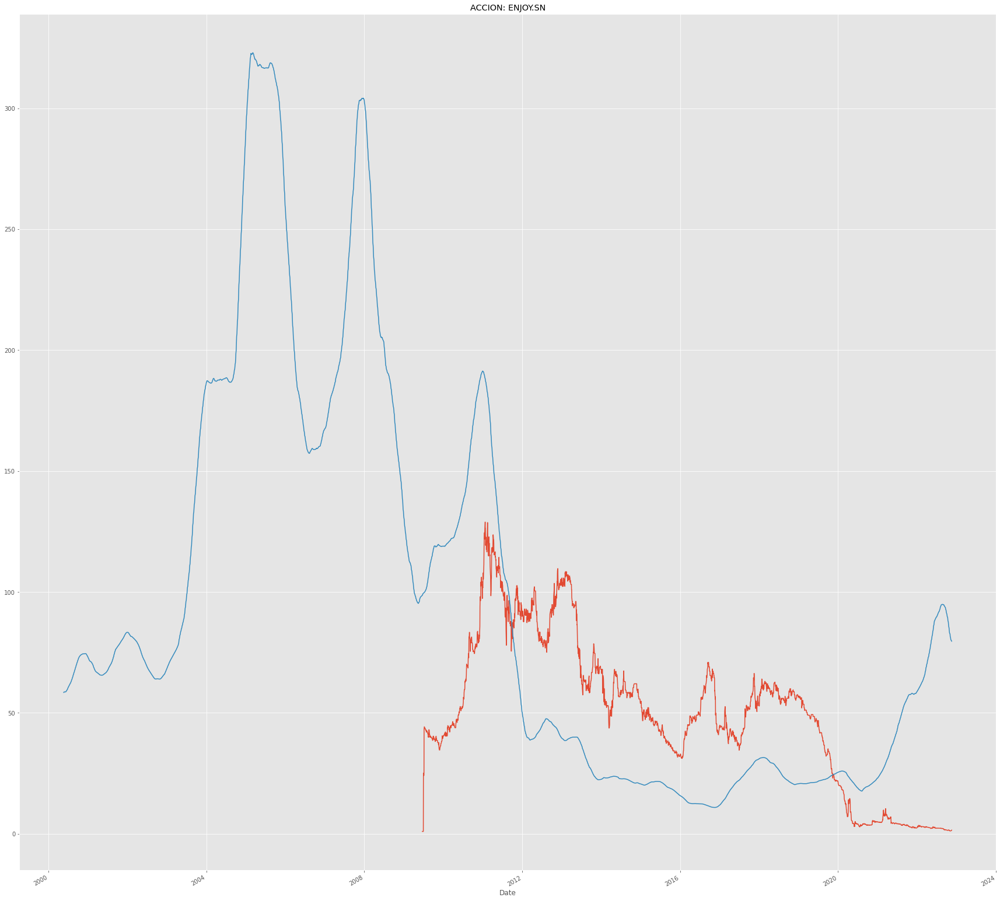

In [208]:
for i in ipsa:
  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)

  globals()[str(i).replace(".","")].head()
  plt.title("ACCION: "+ str(i))
  plt.show()

In [209]:
for i in ipsa:
  globals()[str('dfreg')+str(i).replace(".","")] = globals()[str(i).replace(".","")].loc[:,['Adj Close','Volume']]
  globals()[str('dfreg')+str(i).replace(".","")]['HL_PCT'] = (df['High'] - df['Low']) / df['Close'] * 100.0
  globals()[str('dfreg')+str(i).replace(".","")]['PCT_change'] = (df['Close'] - df['Open']) / df['Open'] * 100.0
  globals()[str('dfreg')+str(i).replace(".","")].head()

In [210]:
import math
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

for i in ipsa:

  # Drop missing value
  globals()[str('dfreg')+str(i).replace(".","")].fillna(value=-99999, inplace=True)

  globals()[str('dfreg')+str(i).replace(".","")].shape
  # We want to separate 1 percent of the data to forecast
  globals()[str('forecast_out')+str(i).replace(".","")] = int(math.ceil(0.01 * len(globals()[str('dfreg')+str(i).replace(".","")])))

  # Separating the label here, we want to predict the AdjClose
  globals()[str('forecast_col')+str(i).replace(".","")] = 'Adj Close'
  globals()[str('dfreg')+str(i).replace(".","")]['label'] = globals()[str('dfreg')+str(i).replace(".","")][globals()[str('forecast_col')+str(i).replace(".","")]].shift(-globals()[str('forecast_out')+str(i).replace(".","")])
  
  globals()[str('X')+str(i).replace(".","")] = np.array(globals()[str('dfreg')+str(i).replace(".","")].drop(['label'], 1))
  

  # Scale the X so that everyone can have the same distribution for linear regression
  globals()[str('X')+str(i).replace(".","")] = preprocessing.scale(globals()[str('X')+str(i).replace(".","")])

  # Finally We want to find Data Series of late X and early X (train) for model generation and evaluation
  globals()[str('X_lately')+str(i).replace(".","")] =  globals()[str('X')+str(i).replace(".","")][-globals()[str('forecast_out')+str(i).replace(".","")]:]
  globals()[str('X')+str(i).replace(".","")] = globals()[str('X')+str(i).replace(".","")][:-globals()[str('forecast_out')+str(i).replace(".","")]]

  # Separate label and identify it as y
  # Separate label and identify it as y
  globals()[str('y')+str(i).replace(".","")] = np.array( globals()[str('dfreg')+str(i).replace(".","")]['label'])
  globals()[str('y')+str(i).replace(".","")] = globals()[str('y')+str(i).replace(".","")][:-int(globals()[str('forecast_out')+str(i).replace(".","")])]

  print('Dimension of X',globals()[str('X')+str(i).replace(".","")].shape)
  print('Dimension of y',globals()[str('y')+str(i).replace(".","")].shape)
  print("")

Dimension of X (1769, 4)
Dimension of y (1769,)

Dimension of X (5731, 4)
Dimension of y (5731,)

Dimension of X (5151, 4)
Dimension of y (5151,)

Dimension of X (5728, 4)
Dimension of y (5728,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (3683, 4)
Dimension of y (3683,)

Dimension of X (5072, 4)
Dimension of y (5072,)

Dimension of X (5709, 4)
Dimension of y (5709,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (5737, 4)
Dimension of y (5737,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (3683, 4)
Dimension of y (3683,)

Dimension of X (5727, 4)
Dimension of y (5727,)

Dimension of X (5735, 4)
Dimension of y (5735,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (1619, 4)
Dimension of y (1619,)

Dimension of X (5646, 4)
Dimension of y (5646,)

Dimension of X (5737, 4)
Dimension of y (5737,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (4990

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local

In [211]:
# Separation of training and testing of model by cross validation train test split
for i in ipsa: 
  globals()[str('X_train')+str(i).replace(".","")], globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")] = train_test_split(globals()[str('X')+str(i).replace(".","")], globals()[str('y')+str(i).replace(".","")], test_size=0.2)

# Model Generation

* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)

## Build the model

In [212]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import datetime


from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

for i in ipsa:

  # Linear regression
  globals()[str('clfreg')+str(i).replace(".","")] = LinearRegression(n_jobs=-1)
  globals()[str('clfreg')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])


  # Quadratic Regression 2
  globals()[str('clfpoly2')+str(i).replace(".","")] = make_pipeline(PolynomialFeatures(2), Ridge())
  globals()[str('clfpoly2')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])

  # Quadratic Regression 3
  globals()[str('clfpoly3')+str(i).replace(".","")] = make_pipeline(PolynomialFeatures(3), Ridge())
  globals()[str('clfpoly3')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])
      
  # KNN Regression
  globals()[str('clfknn')+str(i).replace(".","")] = KNeighborsRegressor(n_neighbors=2)
  globals()[str('clfknn')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])

## Test the model

In [213]:
for i in ipsa:

  globals()[str('confidencereg')+str(i).replace(".","")] = globals()[str('clfreg')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidencepoly2')+str(i).replace(".","")] = globals()[str('clfpoly2')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidencepoly3')+str(i).replace(".","")] = globals()[str('clfpoly3')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidenceknn')+str(i).replace(".","")] = globals()[str('clfknn')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])

  print("The linear regression confidence is ",globals()[str('confidencereg')+str(i).replace(".","")])
  print("The quadratic regression 2 confidence is ",globals()[str('confidencepoly2')+str(i).replace(".","")])
  print("The quadratic regression 3 confidence is ",globals()[str('confidencepoly3')+str(i).replace(".","")])
  print("The knn regression confidence is ",globals()[str('confidenceknn')+str(i).replace(".","")])
  print("")

The linear regression confidence is  0.9139457298848935
The quadratic regression 2 confidence is  0.9221023183070103
The quadratic regression 3 confidence is  0.9285307155027642
The knn regression confidence is  0.8855873112108953

The linear regression confidence is  0.9112654134052659
The quadratic regression 2 confidence is  0.9126359402958151
The quadratic regression 3 confidence is  0.9229420301715575
The knn regression confidence is  0.9063277857240727

The linear regression confidence is  0.8511065402278406
The quadratic regression 2 confidence is  0.862866956046417
The quadratic regression 3 confidence is  0.8648956784579747
The knn regression confidence is  0.8035378377438906

The linear regression confidence is  0.8708859198298506
The quadratic regression 2 confidence is  0.8823610682759307
The quadratic regression 3 confidence is  0.8772080989116409
The knn regression confidence is  0.8526721750645014

The linear regression confidence is  0.94590699540644
The quadratic regre

This means that the linear regression holds the most accuracy of it as being linear and justify the trend of stocks as being linear most of the times. 

However this does not mean we can just put stocks in it. There are still many issues to consider, especially with different companies that have different price trajectories over time. Google really is very linear: Up and to the right. Many companies aren't, so keep this in mind. 

We need to plot out the graph to make the most sense of it 

In [214]:
# Printing the forecast

for i in ipsa:
  globals()[str('forecast_set')+str(i).replace(".","")] = globals()[str('clfreg')+str(i).replace(".","")].predict(globals()[str('X_lately')+str(i).replace(".","")])
  globals()[str('dfreg')+str(i).replace(".","")]['Forecast'] = np.nan
  print(globals()[str('forecast_set')+str(i).replace(".","")], globals()[str('confidencereg')+str(i).replace(".","")], globals()[str('forecast_out')+str(i).replace(".","")])
  print("")

[192.7484691  194.85308372 186.9098213  177.66579577 179.31850444
 187.20419496 167.771405   165.62199273 165.03173849 172.36895475
 177.33976634 167.37396882 175.33217836 184.08316921 191.28778414
 188.50441975 184.89201712 186.79599213] 0.9139457298848935 18

[17896.01933764 17659.88775729 17065.86532309 17087.69768168
 16520.7470351  16216.23088545 16330.9324382  16065.02173867
 16150.32988952 16432.45420178 16117.01407583 16010.22354956
 15425.43035823 14759.46995762 14970.7290088  14696.19672381
 14764.57764884 14304.57777348 13859.01617832 13919.64914447
 14375.55666327 13999.39485294 13248.07883199 13861.75261528
 14242.70421488 14857.05987897 14275.74054226 14330.68782949
 14055.64415784 14536.14745272 14038.13830807 14470.3886091
 14659.70336661 15149.01292906 15136.01916939 15813.41257983
 15123.21848528 15614.16770151 15680.00079784 15777.75207455
 15874.83531039 15852.82176272 15563.23055735 15135.72397407
 15758.02548595 16131.57952231 15169.69479116 14309.4959375
 14531.5

# Plotting the Prediction

In [215]:
for i in ipsa:
  globals()[str('last_date')+str(i).replace(".","")] = globals()[str('dfreg')+str(i).replace(".","")].iloc[-1].name
  globals()[str('last_unix')+str(i).replace(".","")] = globals()[str('last_date')+str(i).replace(".","")]
  globals()[str('next_unix')+str(i).replace(".","")] = globals()[str('last_unix')+str(i).replace(".","")] + datetime.timedelta(days=1)

  for x in globals()[str('forecast_set')+str(i).replace(".","")]:
      globals()[str('next_date')+str(i).replace(".","")] = globals()[str('next_unix')+str(i).replace(".","")]
      globals()[str('next_unix')+str(i).replace(".","")] += datetime.timedelta(days=1)
      globals()[str('dfreg')+str(i).replace(".","")].loc[globals()[str('next_date')+str(i).replace(".","")]] = [np.nan for _ in range(len(globals()[str('dfreg')+str(i).replace(".","")].columns)-1)]+[x]

HLAG.DE
Date
2022-11-02           NaN
2022-11-03           NaN
2022-11-04           NaN
2022-11-07           NaN
2022-11-08           NaN
2022-11-09           NaN
2022-11-10           NaN
2022-11-11           NaN
2022-11-14           NaN
2022-11-15           NaN
2022-11-16           NaN
2022-11-17           NaN
2022-11-18    192.748469
2022-11-19    194.853084
2022-11-20    186.909821
2022-11-21    177.665796
2022-11-22    179.318504
2022-11-23    187.204195
2022-11-24    167.771405
2022-11-25    165.621993
2022-11-26    165.031738
2022-11-27    172.368955
2022-11-28    177.339766
2022-11-29    167.373969
2022-11-30    175.332178
2022-12-01    184.083169
2022-12-02    191.287784
2022-12-03    188.504420
2022-12-04    184.892017
2022-12-05    186.795992
Name: Forecast, dtype: float64
----------------------

MAERSK-B.CO
Date
2022-12-16    14055.644158
2022-12-17    14536.147453
2022-12-18    14038.138308
2022-12-19    14470.388609
2022-12-20    14659.703367
2022-12-21    15149.012929
202

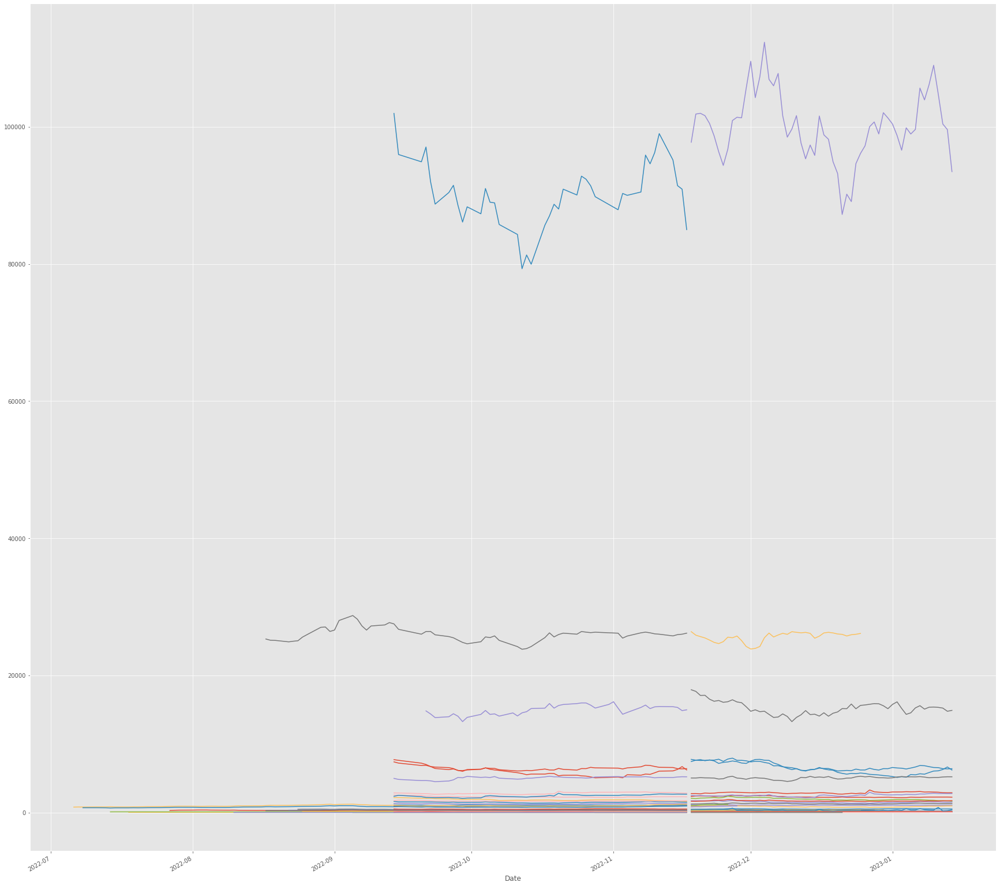

In [221]:
for i in ipsa:
  globals()[str('dfreg')+str(i).replace(".","")]['Adj Close'].tail(100).plot()
  globals()[str('dfreg')+str(i).replace(".","")]['Forecast'].tail(100).plot()

  print(i)
  #print(globals()[str('dfreg')+str(i).replace(".","")]['Adj Close'])
  print(globals()[str('dfreg')+str(i).replace(".","")]['Forecast'].tail(30))
  print("----------------------")
  print()



# Challenges (To Be Continued):
* Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
* Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
* Cleaning out the data
* Importing data files

# Next lesson:
## Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

# Python: How to Get Live Market Data (Less Than 0.1-Second Lag).
This article is going to be a bit special. I am going to test the latest release from Yahoo Finance API for Python, which provide the possibility to get live data with less than a second lag for free.

Before to start
First of all, if you want to track my progress and before to start, you will need to have installed on your machine a Python 3 version and the following packages:
Pandas
NumPy
Yfinance
Plotly (Not mandatory, but useful for plotting)
If any of these packages are not already installed, you can use the pip command, as shown below.

In [217]:
!pip install yfinance
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Once you have ensured that the following packages are installed, we can start.
If you already have experience with Python, you can jump to the second step. The first step will consist of importing data.
I. Import package
The first step will consist of importing the necessary packages.
You will start by importing your packages previously installed by using the following lines of code:

In [218]:
# Raw Package
import numpy as np
import pandas as pd

#Data Source
import yfinance as yf

#Data viz
import plotly.graph_objs as go


def print_real_time(accion_predecirss):
  #Interval required 1 minute
  accion = accion_predecirss
  data = yf.download(tickers=accion, period='1d', interval='1m')

  #declare figure
  fig = go.Figure()


  #Candlestick
  fig.add_trace(go.Candlestick(x=data.index,
                  open=data['Open'],
                  high=data['High'],
                  low=data['Low'],
                  close=data['Close'], name = 'market data'))

  # Add titles
  fig.update_layout(
      title='EVOLUCIÓN EN VIVO DEL PRECIO DE LA ACCIÓN: '+accion,
      yaxis_title='PRECIO DE LAS ACCION ' + accion)

  # X-Axes
  fig.update_xaxes(
      rangeslider_visible=True,
      rangeselector=dict(
          buttons=list([
              dict(count=15, label="15m", step="minute", stepmode="backward"),
              dict(count=45, label="45m", step="minute", stepmode="backward"),
              dict(count=1, label="HTD", step="hour", stepmode="todate"),
              dict(count=3, label="3h", step="hour", stepmode="backward"),
              dict(step="all")
          ])
      )
  )

  #Show
  fig.show()

  #while True:
    #print(data)

for count, value in enumerate(ipsa):
  print("*********************************************************")
  print(count, value)
  print_real_time(value)
  print("*********************************************************")


*********************************************************
0 HLAG.DE
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
1 MAERSK-B.CO
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
2 VALE
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
3 INVERCAP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
4 SQM-B.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
5 CHILE.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
6 BSANTANDER.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
7 COPEC.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
8 CENCOSUD.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
9 FALABELLA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
10 ENELAM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
11 CMPC.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
12 BCI.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
13 VAPORES.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
14 CAP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
15 CCU.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
16 ENELCHILE.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
17 ANDINA-B.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
18 CONCHATORO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
19 PARAUCO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
20 ITAUCORP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
21 AGUAS-A.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
22 COLBUN.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
23 CENCOSHOPP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
24 ENTEL.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
25 MALLPLAZA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
26 IAM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
27 SMU.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
28 ECL.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
29 SONDA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
30 RIPLEY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
31 SECURITY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
32 QUINENCO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
33 BESALCO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
34 MASISA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
35 LTM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
36 ENJOY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************


In [219]:
def make_forecast(ticker, periods, hist='max'):
    """
    forecast the given ticker (stock) period days into the future (from today)

    inputs
    ------
    > ticker
        >> ticker of stock to forecast
    > periods
        >> number of days into the future to forecast (from today's date)
    > hist
        >> amount of historical data to consider
            > default: max
            > options: 1d, 5d, 1mo, 3mo, 6mo, 1y, 2y, 5y, 10y, ytd, max
    """
    # pull historical data from yahoo finance
    stock_data = yf.Ticker(ticker)

    hist_data = stock_data.history(hist, auto_adjust=True)

    # create new dataframe to hold dates (ds) & adjusted closing prices (y)
    df = pd.DataFrame()

    df['ds'] = hist_data.index.values
    df['y'] = hist_data['Close'].values

    # create a Prophet model from that data
    m = Prophet(daily_seasonality=False)
    m.fit(df)

    future = m.make_future_dataframe(periods, freq='D')

    forecast = m.predict(future)

    m.plot(forecast)

    #return forecast